In [20]:
Vᵘ = [1 0.1;0 1]
Vˢ = [1;0.1]
F(x) = [dot(x[1:2],x[1:2])-.1;Vᵘ*x[1:2] - Vˢ*x[3]]
DF(x) = [2x[1:2]' 0;Vᵘ -Vˢ]
x = newton_F(randn(3))
# cond(DF(x))

Before iteration: 0.7596210094276606
After 1 iteration: 0.10486572341854021
After 2 iteration: 0.013419545940375907
After 3 iteration: 0.0003969426339894902
After 4 iteration: 3.9235122740316486e-7
After 5 iteration: 3.8489350595583005e-13
After 6 iteration: 6.938893903907228e-18


3-element Vector{Float64}:
 0.31462676461165695
 0.03178048127390474
 0.3178048127390474

In [1]:
using LinearAlgebra

function newton_F(x)
    # Newton iteration
    num_itr = 0; p = 1; tol = 5e-15
    Fx = F(x)
    
    println("Before iteration: $(norm(Fx,p))")
    
    while num_itr ≤ 100
        dx = DF(x)\Fx
        x = x - dx
        num_itr += 1
        Fx = F(x)
        println("After $(num_itr) iteration: $(norm(Fx,p))")
        if norm(Fx,p) < tol
            break
        end
    end
    return x
end

newton_F (generic function with 1 method)

# 例1 

In [4]:
F(x) = x^2 - 2
DF(x) = 2x
x₀ = 1
x̄ = newton_F(x₀)

Before iteration: 1.0
After 1 iteration: 0.25
After 2 iteration: 0.006944444444444642
After 3 iteration: 6.007304882871267e-6
After 4 iteration: 4.510614104447086e-12
After 5 iteration: 4.440892098500626e-16


1.4142135623730951

In [5]:
x̄ = 1.4
# Define A† and A
A_dagger = DF(x̄); A = 1/A_dagger

# Y0 bound
Y0 = abs(A*F(x̄))

0.014285714285714377

In [6]:
# Z0, Z1
Z0 = 0.; Z1 = 0.

0.0

In [7]:
# Z2 bound
Z2 = A*2

0.7142857142857143

In [8]:
# radii-polynomial
p(r) = Z2*r^2 - (1-Z0-Z1)*r + Y0

p (generic function with 1 method)

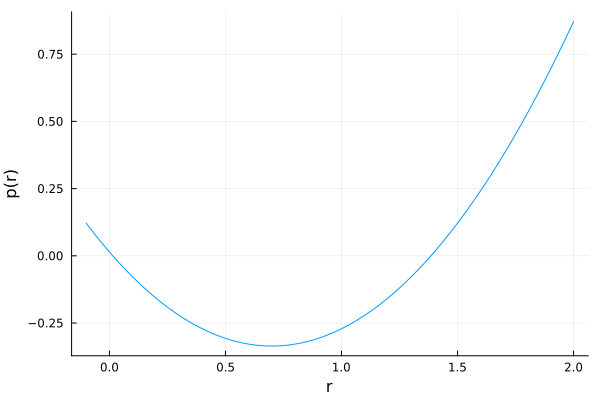

In [9]:
using Plots
plot(p,-0.1,2,xlabel="r",ylabel="p(r)",legend=false)

In [10]:
a = Z2; b = - (1-Z0-Z1); c = Y0;
r_min = (-b - sqrt(b^2-4*a*c))/(2a)
r_max = (-b + sqrt(b^2-4*a*c))/(2a)
@show r_min, r_max

(r_min, r_max) = (0.01443453995989572, 1.3855654600401042)


(0.01443453995989572, 1.3855654600401042)

In [11]:
sqrt(2)

1.4142135623730951

In [12]:
@show x̄-r_min, x̄+r_min

(x̄ - r_min, x̄ + r_min) = (1.3855654600401042, 1.4144345399598957)


(1.3855654600401042, 1.4144345399598957)

In [13]:
@show x̄-r_max, x̄+r_max

(x̄ - r_max, x̄ + r_max) = (0.014434539959895742, 2.785565460040104)


(0.014434539959895742, 2.785565460040104)

# 例２　ロジスティック写像

In [90]:
using Plots
# λ = 4.215351654086267
λ = 1.2
P(x) = λ*x*(1-x)

P (generic function with 1 method)

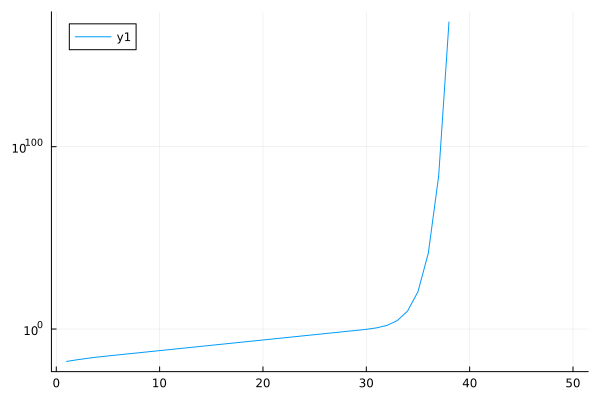

In [62]:
using IntervalArithmetic
length_x = 50
x = interval(zeros(length_x))
x[1] = I"0.01"
for i=1:length_x-1
    x[i+1] = P(x[i])
end
# scatter(λ*ones(length_x),x,legend=false, mc=:red, ms=2, ma=0.5)
plot(radius.(x),yscale=:log10)

In [61]:
radius(x[25])

0.000822395841335033

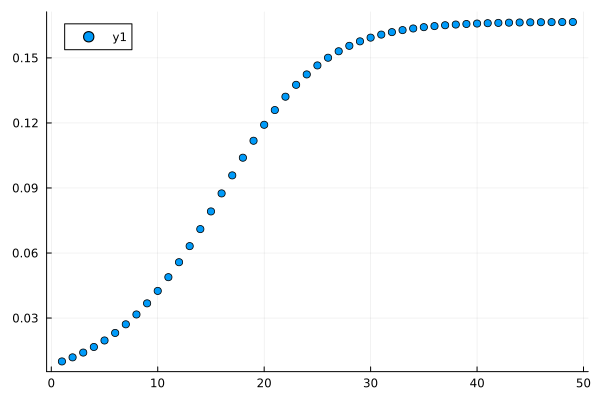

In [91]:
length_x = 49
x = zeros(length_x)
x[1] = 0.01
# x[1] = 0.9520156078132255
 # 0.19256523180939808
 # 0.6554191603773762
for i=1:length_x-1
    x[i+1] = P(x[i])
end
scatter(x)
# scatter(abs.(x),yscale=:log10)
# scatter(λ*ones(length_x),x,legend=false, mc=:red, ms=2, ma=0.5)

In [30]:
function logisticmap(λ)
    P(x) = λ*x*(1-x)
    length_x = 500
    x = zeros(length_x)
    x[1] = rand()/(1+rand())
    for i=1:length_x-1
        x[i+1] = P(x[i])
    end
    scatter!(plt,λ*ones(Int(length_x/2)),x[Int(length_x/2):end],legend=false, mc=:red, ms=2, ma=0.5)
end

logisticmap (generic function with 1 method)

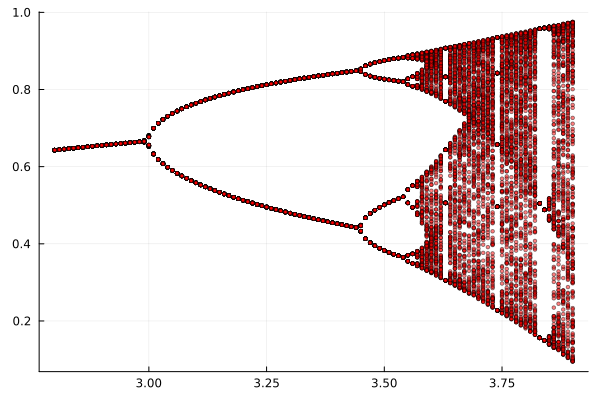

In [39]:
plt=plot()
for λ = 2.8:0.01:3.9
    logisticmap(λ)
end
plot(plt)

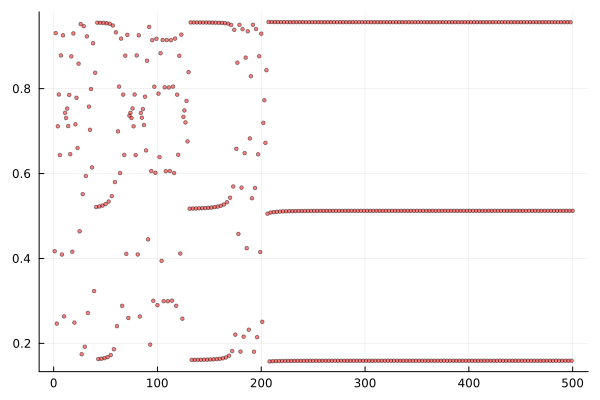

In [37]:
λ = 3.8285
P(x) = λ*x*(1-x)
length_x = 500
x = zeros(length_x)
x[1] = rand()/(1+rand())
for i=1:length_x-1
    x[i+1] = P(x[i])
end
scatter(x,legend=false, mc=:red, ms=2, ma=0.5)

In [40]:
λ = 3.8285
F(x) = [x[1]-λ*x[3]*(1-x[3])
    x[2]-λ*x[1]*(1-x[1])
    x[3]-λ*x[2]*(1-x[2])]
DF(x) = [1 0 -λ*(1-2x[3]);
    -λ*(1-2x[1]) 1 0;
    0 -λ*(1-2x[2]) 1]

DF (generic function with 1 method)

In [41]:
x₀ = [1., -1., 1.]
x̄ = newton_F(x₀)

Before iteration: 10.657
After 1 iteration: 2.3553229719093283
After 2 iteration: 0.48857824066599087
After 3 iteration: 0.053233732542735446
After 4 iteration: 0.0011929079695056355
After 5 iteration: 0.00019541215847479476
After 6 iteration: 4.5165000921137954e-5
After 7 iteration: 7.917284009423264e-6
After 8 iteration: 5.772880026511107e-7
After 9 iteration: 4.206630044301107e-9
After 10 iteration: 2.2984392167302303e-13
After 11 iteration: 1.6653345369377348e-16


3-element Vector{Float64}:
 0.9560908297838433
 0.16072485186805582
 0.5164354533231912

In [42]:
# Define A and A_dagger
A_dagger = DF(x̄)
A = inv(DF(x̄))

3×3 Matrix{Float64}:
 -7.05598    2.30679   0.887969
 24.6415    -7.05598  -3.10104
 64.0145   -18.3302   -7.05598

In [43]:
# Y0 bound
Y0 = norm(A*F(x̄),1)

4.61181382442399e-15

In [44]:
# Z0
Z0 = norm(I - A*A_dagger,1)

5.329070518200751e-15

In [45]:
# Z1 
Z1 = 0

0

In [46]:
# Z2
Z2 = 2*abs(λ)*norm(A,1)

1029.4835758759393

In [47]:
# radii-polynomial
p(r) = Z2*r^2 - (1-Z0-Z1)*r + Y0

p (generic function with 1 method)

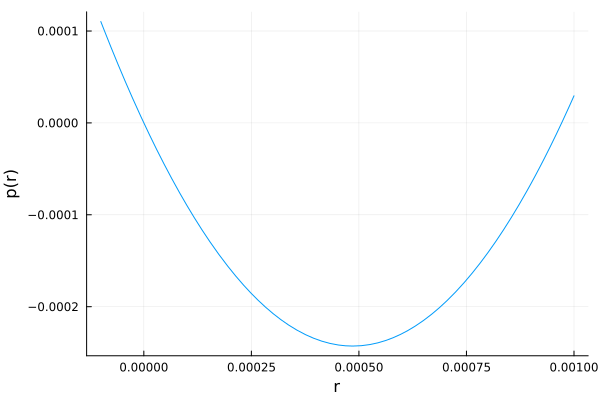

In [48]:
plot(p,-1e-4,1e-3,xlabel="r",ylabel="p(r)",legend=false)

In [49]:
a = Z2; b = - (1-Z0-Z1); c = Y0;
r_min = (-b - sqrt(b^2-4*a*c))/(2a)
r_max = (-b + sqrt(b^2-4*a*c))/(2a)
@show r_min, r_max

(r_min, r_max) = (4.611839727135578e-15, 0.0009713608098549739)


(4.611839727135578e-15, 0.0009713608098549739)

In [50]:
[x̄.-r_min, x̄.+r_min]

2-element Vector{Vector{Float64}}:
 [0.9560908297838386, 0.16072485186805122, 0.5164354533231865]
 [0.956090829783848, 0.16072485186806043, 0.5164354533231958]

# 例3 $\lambda$も未知数の場合

In [92]:
eta = 1.6311
# eta = 1.8
# eta = 2.5

F((lam, x, y, z)) = [x + y + z - eta
    x - lam*z*(1-z)
    y - lam*x*(1-x)
    z - lam*y*(1-y)]

DF((lam, x, y, z)) = [0 1 1 1;
    -z*(1-z ) 1 0 -lam*(1-2*z);
    -x*(1-x) -lam*(1-2*x) 1 0;
    -y*(1-y) 0 -lam*(1-2*y) 1]

DF (generic function with 1 method)

In [93]:
x₀ = [3.0,1.0,-1.0,1.0]
x̄ = newton_F(x₀)

Before iteration: 9.6311
After 1 iteration: 0.9945924694922448
After 2 iteration: 0.24440101255248137
After 3 iteration: 0.004630722270495796
After 4 iteration: 1.1323824460562903e-5
After 5 iteration: 9.505718434610344e-11
After 6 iteration: 3.608224830031759e-16


4-element Vector{Float64}:
 3.828429696603496
 0.9562749287915785
 0.1600788558411345
 0.5147462153672872

In [94]:
# Define A and A_dagger
A_dagger = DF(x̄)
A = inv(DF(x̄))

4×4 Matrix{Float64}:
  0.0103293  -4.4849      1.28078    0.49606
 -0.0860524  -0.110354    0.342453   0.0985123
  0.301067    0.198007   -0.142852  -0.323424
  0.784985   -0.0876533  -0.199601   0.224912

In [95]:
# Y0 bound
Y0 = norm(A*F(x̄),1)

3.5752727457314166e-16

In [96]:
# Z0
Z0 = norm(I - A*A_dagger,1)

2.55534223328401e-15

In [97]:
# Z1 
Z1 = 0

0

In [108]:
# Z2
λ, x1, x2, x3 = abs.(x̄)
B(r) = [
    0 0 0 0
    1+2*(x3)+r 0 0 (1+(x3)+r)+λ+r
    1+2*(x1)+r (1+(x1)+r)+λ+r 0 0
    1+2*(x2)+r 0 (1+(x2)+r)+λ+r 0]
Z2_func(r) = norm(A*B(r),1)

Z2_func (generic function with 1 method)

In [109]:
Z2_func(0.1)

51.61061755570963

In [110]:
# radii-polynomial
p(r) = Z2_func(r)*r^2 - (1-Z0-Z1)*r + Y0

p (generic function with 1 method)

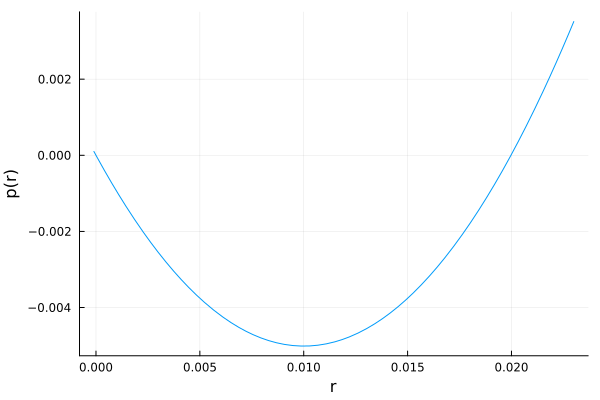

In [116]:
plot(p,-1e-4,0.023,xlabel="r",ylabel="p(r)",legend=false)

In [119]:
using ForwardDiff
F(x) = p(x)
DF(x)= ForwardDiff.derivative(p,x)

DF (generic function with 1 method)

In [121]:
r_min = newton_F(0)

Before iteration: 3.5752727457314166e-16
After 1 iteration: 6.360191048344408e-30


3.575272745731426e-16

In [122]:
r_max = newton_F(1)

Before iteration: 68.02409612124451
After 1 iteration: 18.786403440132222
After 2 iteration: 5.0421082273648405
After 3 iteration: 1.318119861748277
After 4 iteration: 0.3371790914808099
After 5 iteration: 0.08429961291297385
After 6 iteration: 0.020055739856715566
After 7 iteration: 0.004031529664403934
After 8 iteration: 0.0004510306490391644
After 9 iteration: 9.342930671167768e-6
After 10 iteration: 4.361568047874731e-9
After 11 iteration: 9.57741597261117e-16


0.0199751224013458

In [123]:
@show r_min, r_max

(r_min, r_max) = (3.575272745731426e-16, 0.0199751224013458)


(3.575272745731426e-16, 0.0199751224013458)

In [124]:
[x̄.-r_min, x̄.+r_min]

2-element Vector{Vector{Float64}}:
 [3.8284296966034956, 0.9562749287915782, 0.16007885584113413, 0.5147462153672868]
 [3.8284296966034965, 0.9562749287915788, 0.16007885584113485, 0.5147462153672875]